In [1]:
#Load modules
import os
import pandas as pd
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import seaborn as sbs
import dabest
from datetime import datetime
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from tqdm import tqdm
from TruMeLan import *
from time import sleep
import plotly.graph_objects as go
from scipy.signal import find_peaks
from numpy import genfromtxt
from scipy import fftpack
import scipy.stats as stats
import scipy 
from struct import *
import math

In [4]:
eOPN3_0s=[]
for dirpath, dirnames, filenames in os.walk('E:\\TruMelan data\\Nicole\\eOPN3 ChAT\\duration\\0s\\Data'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_0s.append(csv_read(os.path.join(dirpath, filename)))
        
eOPN3_0_3s=[]
for dirpath, dirnames, filenames in os.walk('E:\\TruMelan data\\Nicole\\eOPN3 ChAT\\duration\\0.3s\\Data'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_0_3s.append(csv_read(os.path.join(dirpath, filename)))        
        
        
eOPN3_0_5s=[]
for dirpath, dirnames, filenames in os.walk('E:\\TruMelan data\\Nicole\\eOPN3 ChAT\\duration\\0.5s\\Data'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_0_5s.append(csv_read(os.path.join(dirpath, filename)))
        
        
eOPN3_1s=[]
for dirpath, dirnames, filenames in os.walk('E:\\TruMelan data\\Nicole\\eOPN3 ChAT\\duration\\1s\\Data'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_1s.append(csv_read(os.path.join(dirpath, filename)))        
        
eOPN3_3s=[]
for dirpath, dirnames, filenames in os.walk('E:\\TruMelan data\\Nicole\\eOPN3 ChAT\\duration\\3s\\Data'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_3s.append(csv_read(os.path.join(dirpath, filename)))
        
eOPN3_5s=[]
for dirpath, dirnames, filenames in os.walk('E:\\TruMelan data\\Nicole\\eOPN3 ChAT\\duration\\5s\\Data'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_5s.append(csv_read(os.path.join(dirpath, filename)))

In [9]:
test = eOPN3_0_5s[0]
test[test['Seconds']>80]

,Time_ms,Record Number,Timestamp (ms),State,Activity Level,Movr Frame,cXmm,Speed_Av_mm_per_sec,Heading_deg,cYmm,Error_code,e3,e4,e5,e6,Bout_frame_number,Bout_duration_rough,Hour,Seconds,Minutes
3596,80014,3596,517993517,Locomotive,1192,3596,4.621189,9.633840,164.687241,2.056642,0.0,Locomotive,False,279,80036.0,68,1533.333333,0.022226,80.014,1.333567
3597,80036,3597,517993539,Locomotive,1103,3597,4.129534,12.066426,174.241669,1.940206,0.0,Locomotive,False,279,80058.0,69,1555.555556,0.022232,80.036,1.333933
3598,80058,3598,517993561,Locomotive,1025,3598,4.129534,12.036421,174.241669,1.940206,3.0,Locomotive,False,279,80081.0,70,1577.777778,0.022238,80.058,1.334300
3599,80081,3599,517993584,Locomotive,1166,3599,4.129534,9.584216,174.241669,1.940206,4.0,Locomotive,False,279,80103.0,71,1600.000000,0.022245,80.081,1.334683
3600,80103,3600,517993606,Locomotive,1275,3600,4.129534,7.807482,174.241669,1.940206,3.0,Locomotive,False,279,80125.0,72,1622.222222,0.022251,80.103,1.335050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161074,3610005,161074,521523508,Stationary Static,0,161074,21.646967,0.007280,321.584137,1.764558,0.0,Stationary Static,False,9475,3610027.0,1767,39288.888889,1.002779,3610.005,60.166750
161075,3610027,161075,521523530,Stationary Static,0,161075,21.650522,0.017370,321.700836,1.760723,0.0,Stationary Static,False,9475,3610049.0,1768,39311.111111,1.002785,3610.027,60.167117
161076,3610049,161076,521523552,Stationary Static,0,161076,21.650209,0.025633,321.726898,1.762616,0.0,Stationary Static,False,9475,3610072.0,1769,39333.333333,1.002791,3610.049,60.167483
161077,3610072,161077,521523575,Stationary Static,0,161077,21.650200,0.015758,321.704926,1.760478,0.0,Stationary Static,False,9475,3610094.0,1770,39355.555556,1.002798,3610.072,60.167867


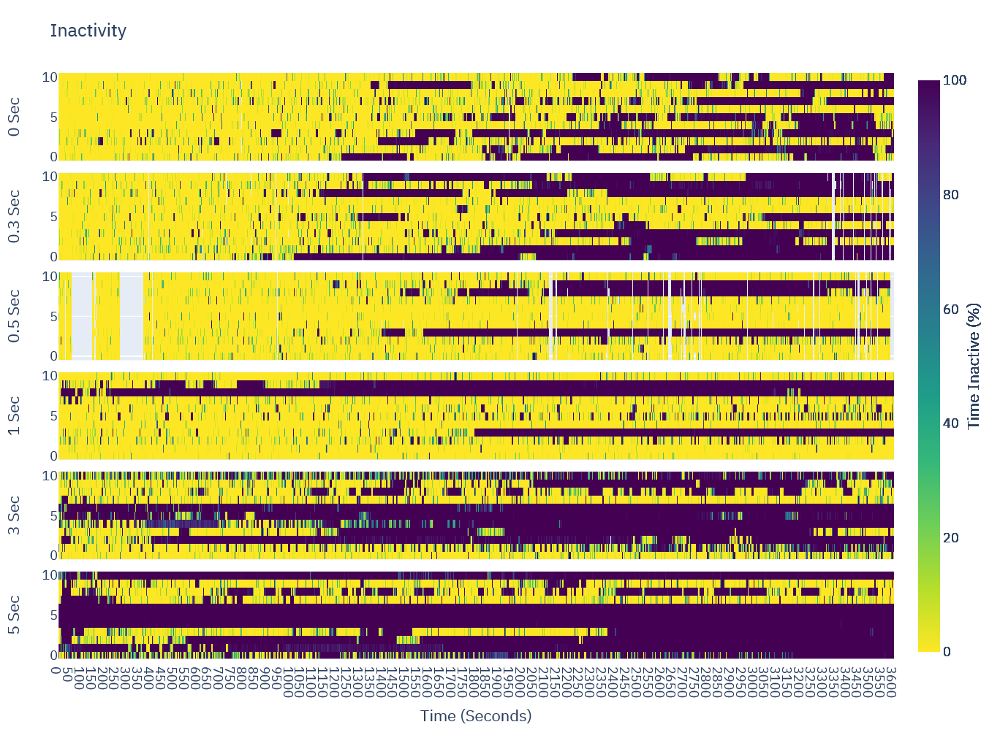

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

fig = make_subplots(rows=6, cols=1,shared_xaxes=True,horizontal_spacing=0.1,vertical_spacing=0.02)
a=0.5

for d,r in zip([eOPN3_0s,eOPN3_0_3s,eOPN3_0_5s,eOPN3_1s,eOPN3_3s, eOPN3_5s],[1,2,3,4,5, 6]):
    df_heat_full=pd.DataFrame()
    for idx,df in enumerate(d):
        start = np.arange(math.floor(df['Seconds'].iloc[0]), math.ceil(df['Seconds'].iloc[-1]), 1)
        end = np.arange(math.floor(df['Seconds'].iloc[0])+1, math.ceil(df['Seconds'].iloc[-1]+1), 1)
        cols = ['Time', 'SS', 'SA', 'LO', 'Fly'] #Will need to change the metric names if they change
        lst = []
        for a,b in zip(start, end):
            df_1min=df[(df['Seconds']>=a) & (df['Seconds']<b)]
            if len(df_1min)>1:
                ss = (len(df_1min[df_1min['State']=='Stationary Static'])/ len(df_1min)) *100
                sa = (len(df_1min[df_1min['State']=='Stationary Active'])/ len(df_1min)) *100
                lo = (len(df_1min[df_1min['State']=='Locomotive']) / len(df_1min)) *100
                lst.append([b-start[0], ss,sa,lo, idx])
            else:
                lst.append([b, np.NaN,np.NaN,np.NaN, idx])
        df_heat = pd.DataFrame(lst, columns=cols)
        df_heat_full = pd.concat([df_heat_full,df_heat])
    fig.append_trace(go.Heatmap(z=df_heat_full['SS'],x=df_heat_full['Time'],y=df_heat_full['Fly'],colorscale='Viridis_r',zmin=0,zmax=100,showscale=True), row=r, col=1)   
    
 
    
    
    
    
for x,txt in zip([1,2,3,4,5,6],['0 Sec', '0.3 Sec', '0.5 Sec', '1 Sec', '3 Sec','5 Sec']):
    fig.update_yaxes(title_text=txt,row=x, col=1)
    fig.update_xaxes(range=[0,3610],row=x, col=1)

fig.update_xaxes(title="Time (Seconds)",range=[0,3600], tickvals=np.arange(0,3700,50), row=6,col=1)

fig.update_layout(title='Inactivity', font=dict(family="ibm plex sans",size=18,),showlegend=False, autosize=False,width=1200,height=1000, template="plotly")
fig.update_traces(zmin=0, zmax=100, colorbar=dict(title='Time Inactive (%)', titleside='right'),selector=dict(type='heatmap'))

fig.show()

#fig.write_image("duration_overall.svg")

In [ ]:
eOPN3_0s=[]
for dirpath, dirnames, filenames in os.walk('D:\\Nicole Lee - HDD\\ACC Lab Dropbox\\ACC Lab\\Nicole Lee\\DATA\\New optogenetics\\TruMelan\\eOPN3 data\\eOPN3 6793\\0s'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_0s.append(csv_read(os.path.join(dirpath, filename)))
        
eOPN3_0_3s=[]
for dirpath, dirnames, filenames in os.walk('D:\\Nicole Lee - HDD\\ACC Lab Dropbox\\ACC Lab\\Nicole Lee\\DATA\\New optogenetics\\TruMelan\\eOPN3 data\\eOPN3 6793\\0.3s'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_0_3s.append(csv_read(os.path.join(dirpath, filename)))        
        
        
eOPN3_0_5s=[]
for dirpath, dirnames, filenames in os.walk('D:\\Nicole Lee - HDD\\ACC Lab Dropbox\\ACC Lab\\Nicole Lee\\DATA\\New optogenetics\\TruMelan\\eOPN3 data\\eOPN3 6793\\0.5s'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_0_5s.append(csv_read(os.path.join(dirpath, filename)))
        
        
eOPN3_1s=[]
for dirpath, dirnames, filenames in os.walk('D:\\Nicole Lee - HDD\\ACC Lab Dropbox\\ACC Lab\\Nicole Lee\\DATA\\New optogenetics\\TruMelan\\eOPN3 data\\eOPN3 6793\\1s'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_1s.append(csv_read(os.path.join(dirpath, filename)))        
        
eOPN3_3s=[]
for dirpath, dirnames, filenames in os.walk('D:\\Nicole Lee - HDD\\ACC Lab Dropbox\\ACC Lab\\Nicole Lee\\DATA\\New optogenetics\\TruMelan\\eOPN3 data\\eOPN3 6793\\3s'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_3s.append(csv_read(os.path.join(dirpath, filename)))
        
eOPN3_5s=[]
for dirpath, dirnames, filenames in os.walk('D:\\Nicole Lee - HDD\\ACC Lab Dropbox\\ACC Lab\\Nicole Lee\\DATA\\New optogenetics\\TruMelan\\eOPN3 data\\eOPN3 6793\\5s'):
    for filename in [f for f in filenames if f.endswith(".csv")]:
        eOPN3_5s.append(csv_read(os.path.join(dirpath, filename)))